In [1]:
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
import sympy as sp
from scipy.integrate import odeint

from matplotlib import animation, rc
from IPython.display import HTML
rc('animation', html='jshtml')
import seaborn as sns

#Define plotting style:
sns.set() #Set style
sns.set_style('ticks',{'font.family':'serif', 'font.serif':'Times New Roman'})
sns.set_context('talk', font_scale=0.9,  rc={"lines.linewidth": 5})

### Curvas cônicas

In [3]:
def rv(theta,m=10.0,L=1.0,E=1.0,k=0.1):

    Emin = -m*k**2/(2*L**2)
    if E < Emin:
        E = Emin
        epsilon = 0
    else:
        epsilon = np.sqrt(1+2*E*L**2/(m*k**2)) #excentricidade
    if E == 0.:
        a = L**2/(m*k)
    else:
        a = k/(2*np.abs(E)) #tamanho do eixo    

    
    if epsilon > 1:
        thetamax = np.arccos(-1/epsilon)
    else:
        thetamax = np.pi

    if theta <= -thetamax or theta >= thetamax:
        return None
    if E == 0.:
        r = a/(1+np.cos(theta))
    else:
        r = a*np.abs(epsilon**2-1)/(1+epsilon*np.cos(theta))
    x = r*np.cos(theta)
    y = r*np.sin(theta)
    
    
    return [x,y]

In [4]:


m = 10.0 #Massa
L = 0.7 #Momento angular
k = 0.1 #Constante da força gravitacional (F = -k/r^2)
Emin = -m*k**2/(2*L**2)

#Hipérbole:
E = max(0.1,Emin) #Energia
epsilon = np.sqrt(1+2*E*L**2/(m*k**2)) #excentricidade
a = k/(2*np.abs(E)) #tamanho do eixo
print(epsilon)

thetavals = np.linspace(-np.pi,np.pi,500)
rvalsH = np.array([rv(t,m=m,L=L,E=E,k=k) for t in thetavals if rv(t,m=m,L=L,E=E,k=k) is not None])

#Elipse:
E = max(-0.047,Emin)
epsilon = np.sqrt(1+2*E*L**2/(m*k**2)) #excentricidade
print(epsilon)

rvalsE = np.array([rv(t,m=m,L=L,E=E,k=k) for t in thetavals if rv(t,m=m,L=L,E=E,k=k) is not None])


#Parábola:
E = 0.0
epsilon = np.sqrt(1+2*E*L**2/(m*k**2)) #excentricidade
print(epsilon)

rvalsP = np.array([rv(t,m=m,L=L,E=E,k=k) for t in thetavals if rv(t,m=m,L=L,E=E,k=k) is not None])


#Círculo
E = Emin
epsilon = np.sqrt(1+2*E*L**2/(m*k**2)) #excentricidade
print(epsilon)

rvalsC = np.array([rv(t,m=m,L=L,E=E,k=k) for t in thetavals if rv(t,m=m,L=L,E=E,k=k) is not None])


1.4071247279470287
0.7344385610791416
1.0
0.0


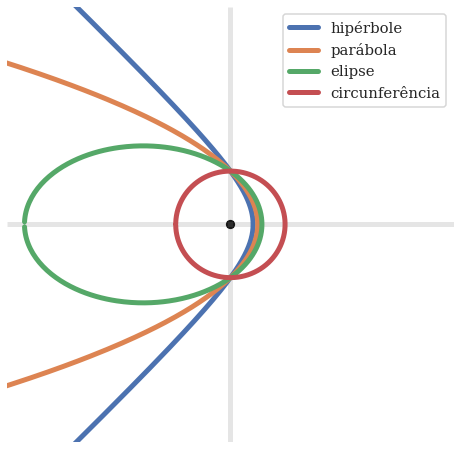

In [5]:
fig = plt.figure(figsize=(8,8))

plt.plot(rvalsH[:,0],rvalsH[:,1],label='hipérbole')
plt.plot(rvalsP[:,0],rvalsP[:,1],label='parábola')
plt.plot(rvalsE[:,0],rvalsE[:,1],label='elipse')
plt.plot(rvalsC[:,0],rvalsC[:,1],label='circunferência')
plt.hlines(y=0,xmin=-2,xmax=2,color='gray',alpha=0.2)
plt.vlines(x=0,ymin=-2,ymax=2,color='gray',alpha=0.2)
plt.scatter([0],[0],s=60,c='black')
plt.xlim(-2,2)
plt.ylim(-2,2)
plt.xticks([])
plt.yticks([])
# plt.xlabel(r'$x$')
# plt.ylabel(r'$y$')
plt.legend()
plt.box(False)
plt.savefig('conicas.png')
plt.show()


### Equações Diferenciais

In [50]:
#Formato: w[t] = [r(t),vr(t),theta(t)], dw/dt = [dr/dt,dvr/dt,dtheta/dt] = [vr,F/m+L**2/(m**3),L/(m*r**2)]
def RHS(w,t,k=0.1,m=10.0,L=0.7):
    r = w[0] #vetor posição
    vr = w[1] #velocidade radial
    theta = w[2] #angulo polar
        
    return np.hstack((vr,-k/(m*r**2) + L**2/(m**2*r**3),L/(m*r**2))) #lado direito das eqs diferenciais

### Condições Iniciais

In [74]:
#Constantes
m = 10.0 #Massa
L = 0.7 #Momento angular
k = 0.1 #Constante da força gravitacional (F = -k/r^2)
Emin = -m*k**2/(2*L**2)
E = Emin #Energia

if E < Emin:
    E = Emin
    epsilon = 0
else:
    epsilon = np.sqrt(1+2*E*L**2/(m*k**2)) #excentricidade
if epsilon > 1:
    thetamax = np.arccos(-1/epsilon)
else:
    thetamax = np.pi

print(epsilon,thetamax)    

0.0 3.141592653589793


In [75]:
theta0 = -0.8*thetamax
r0 = np.linalg.norm(rv(theta0,m=m,L=L,E=E,k=k))
vr0 = -np.sqrt(2/m)*np.sqrt(E-L**2/(2*m*r0**2)+k/r0)
w0 = np.hstack((r0,vr0,theta0)) #Condições iniciais

### Soluções

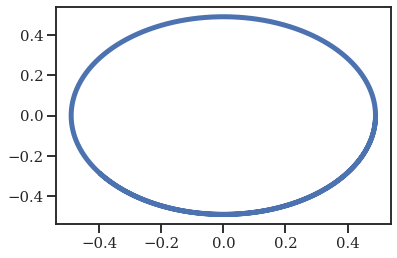

In [82]:
t0 = 0 #instante no qual as condições iniciais são definidas
tf = 30 #instante final para calcular as soluções
n = 1000 #número de pontos entre t0 e tf para calcular as soluções

tlist = np.linspace(t0,tf,n) #lista de valores para calcular as soluções r(t) e v(t)

w_sol = odeint(RHS,w0,tlist,args=(k,m,L,)) #Solução

r_sol = w_sol[:,0] #r(t) calculado em tlist
theta_sol = w_sol[:,2] #theta(t) calculado em tlist

xsol = r_sol*np.cos(theta_sol)
ysol = r_sol*np.sin(theta_sol)
ysol = np.vstack((xsol,ysol)).T

plt.plot(ysol[:,0],ysol[:,1])
# plt.xlim(min(ysol[:,0]),max(ysol[:,0]))
# plt.ylim(min(ysol[:,1]),max(ysol[:,1]))

plt.show()

### Animação

In [83]:
# Set up plot
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot()
tvals = tlist

#Get x and y coordinates:

point, = ax.plot(ysol[:1,0],ysol[:1,1],'o',markersize=10,zorder=10) 
line, = ax.plot(ysol[:,0],ysol[:,1],'-',alpha=0.5)
ax.vlines(x=0,ymin=-max(abs(ysol[:,1])),ymax=max(abs(ysol[:,1])),alpha=0.2,linewidth=2)
ax.hlines(y=0,xmin=-max(abs(ysol[:,0])),xmax=max(abs(ysol[:,0])),alpha=0.2,linewidth=2)


ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlim(-1,1)
ax.set_ylim(-1,1)
# ax.axis("off")
title = plt.title('$t = 0$')

# Animate plot
def init():
    point.set_data([], [])
    line.set_data(ysol[:1,0], ysol[:1,1])

    title.set_text("")
    return (point, line, title)

def animate(i):    
    
    t = tvals[i]
    
    point.set_data(ysol[i,0], ysol[i,1])
    line.set_data(ysol[:i,0], ysol[:i,1])

    title.set_text("t = %.2f" % t)
        
    return (point, line, title)

# call the animator.  blit=True means only re-draw the parts that have changed.
frames = len(tvals)
aspeed = 10.0

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=frames, interval=100/aspeed, blit=True)

#Para salvar corretamente, tem que descomentar a linha de baixo
# anim.save('orbita_hiperbolica.mp4', fps=40, extra_args=['-vcodec', 'libx264'])
# anim.save('orbita_parabolica.mp4', fps=40, extra_args=['-vcodec', 'libx264'])
# anim.save('orbita_eliptica.mp4', fps=40, extra_args=['-vcodec', 'libx264'])
anim.save('orbita_circular.mp4', fps=40, extra_args=['-vcodec', 'libx264'])

#Para ver o video no notebook deve comentar a linha de cima
plt.close()
anim
